#**Classifying Audio with Neural Networks - CSC 535 Deep Learning - Final Project**

Hello! Welcome to this project. Below, I have mounted the used dataset for this project from my Google Drive to this Colab Notebook. It is about 5.6 GB (zipped), and can be found here:

https://drive.google.com/drive/folders/1kwkbF3Z2tphu4Nd2TDrQkweWAXsZ-hqQ?usp=sharing

or here:

https://urbansounddataset.weebly.com/

Anyone with the link can edit! File name is "UrbanSound8K".

In this project, I aim to perform feature extraction from audio with the use of a key library, Librosa, and classify said audio into respective categories. Detailed explanations for code and functionality are provided in preceding cell sections.

This project is divided into three sections, namely:

Feedforward Neural Network,

Convolutional Neural Network,


and


Recurrent Neural Network.

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive')
ROOT = "/content/drive/MyDrive/Ummhowaboutnow/"
os.chdir(ROOT)

KeyboardInterrupt: ignored

I've extracted the .tar file from my mounted dataset, here. This process takes about 10-15 minutes.
You might see an alert "Operation not permitted: './UrbanSound8K/audio/fold10/.DS_Store'" but, this is just Colab being unable to read the Desktop Services Store (an invisible file on the macOS system which is created automatically during compression. I have a WindowsOS.)

In [ ]:
import tarfile
tar = tarfile.open('UrbanSound8K.tar.gz')
tar.extractall()
print('Done')

PermissionError: ignored

Crawling the directory and its sub-directories in order to get a list of all file-paths:

In [ ]:
def get_all_file_paths(directory): 
  
    # Initializing empty file paths list: 
    file_paths = [] 
  
    # Crawling through directory and subdirectories:
    for root, directories, files in os.walk(directory): 
        for filename in files: 
            # Joining two strings in order to form the full filepath: 
            filepath = os.path.join(root, filename) 
            file_paths.append(filepath) 
  
    # Returning all file paths: 
    return file_paths      

#**Visualizing and Exploring Data**

Importing required libraries:

In [ ]:
import glob
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
from sklearn.model_selection import KFold

import tensorflow as tf
from tensorflow import keras

%matplotlib inline
plt.style.use('ggplot')

**NOTE**: Proceeding to interpret sound files to determine their uniqueness. As mentioned earlier, this project uses the Librosa library extensively. Log power spectrograms and waves are plotted with Librosa.

Alternatively, Specgram, from Matplotlib illustrates the spectrum of these sounds. 

In [ ]:
import glob
import os
import librosa
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
from sklearn.model_selection import KFold
import librosa.display

import tensorflow as tf
from tensorflow import keras

%matplotlib inline
plt.style.use('ggplot')

def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(19,10), dpi=300)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(12,10), dpi = 300)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

    def plot_log_power_specgram(sound_names,raw_sounds): i = 1
    fig = plt.figure(figsize=(12,11), dpi = 300)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()
    
# stft calculates spectral contrast
# mfccs is Mel-frequency cepstral coefficients
# chroma is chroma-stft which calculates a chromagram via power spectrogram/waveform
# mel is a melspectrogram which calculates a mel-scaled power spectrogram

def extract_feature(file_name):
    X, sample_rate = librosa.load(file_name)
    stft = np.abs(librosa.stft(X))
    mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
    chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
    return mfccs,chroma,mel,contrast,tonnetz



def parse_audio_files(parent_dir,sub_dir,file_ext='*.wav'): 
  features, labels = np.empty((0,193)), np.empty(0) # 193 => total features 
  for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
      print (fn)
      try: 
        mfccs, chroma, mel, contrast,tonnetz = extract_feature(fn)
      except: 
        continue
      ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
      features = np.vstack([features,ext_features])
      labels = np.append(labels, int(fn.split('/')[3].split('-')[1]))

  return np.array(features, dtype=np.float32), np.array(labels, dtype = np.int8)

Retrieving directory:

In [ ]:
import os
os.getcwd()

'/content/drive/My Drive/Ummhowaboutnow'

**NOTE:** This dataset is divided into 10-folds by default. It contains 8,732 sound clips with a length of 4 seconds each, from ten classes: car horn, children playing, air conditioner, dog bark, engine idling, drilling, gunshot, siren, street music, and jackhammer. Later, I've pre-processed the sound files so that they can be stored as numpy arrays for ease of use.

Here, I've redirected the folder to visualize audio from fold1.

In [ ]:
os.chdir('/content/drive/MyDrive/Ummhowaboutnow/UrbanSound8K/audio/fold1')

Proceeding to plot spectrograms of some sound clips:

**Please note**: Google Colab offers limited options for resolutions and display. For higher, cleaner, and efficient visualization, Colab was unable to run said code and kept crashing my session. Therefore, if the plot is a little cramped, it is only because of display limitations. (Also, please omit the "value error" line at the end of the spectrogram. The alert is unrelated to, and doesn't affect respective visualization. Thank you.)

In [ ]:
sound_file_paths = ["57320-0-0-7.wav","24074-1-0-3.wav",
                    "15564-2-0-1.wav","31323-3-0-1.wav",
                    "46669-4-0-35.wav","89948-5-0-0.wav",
                    "46656-6-0-0.wav","103074-7-3-2.wav",
                    "106905-8-0-0.wav","108041-9-0-4.wav"]
sound_names = ["air conditioner","car horn","children playing",
               "dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]

In [ ]:
raw_sounds = load_sound_files(sound_file_paths)


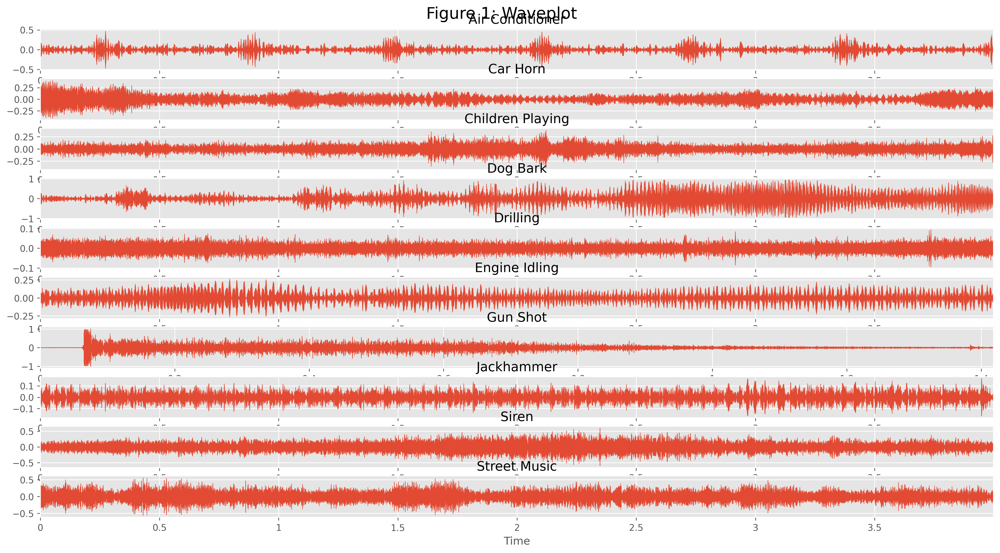

In [ ]:
plot_waves(sound_names,raw_sounds)


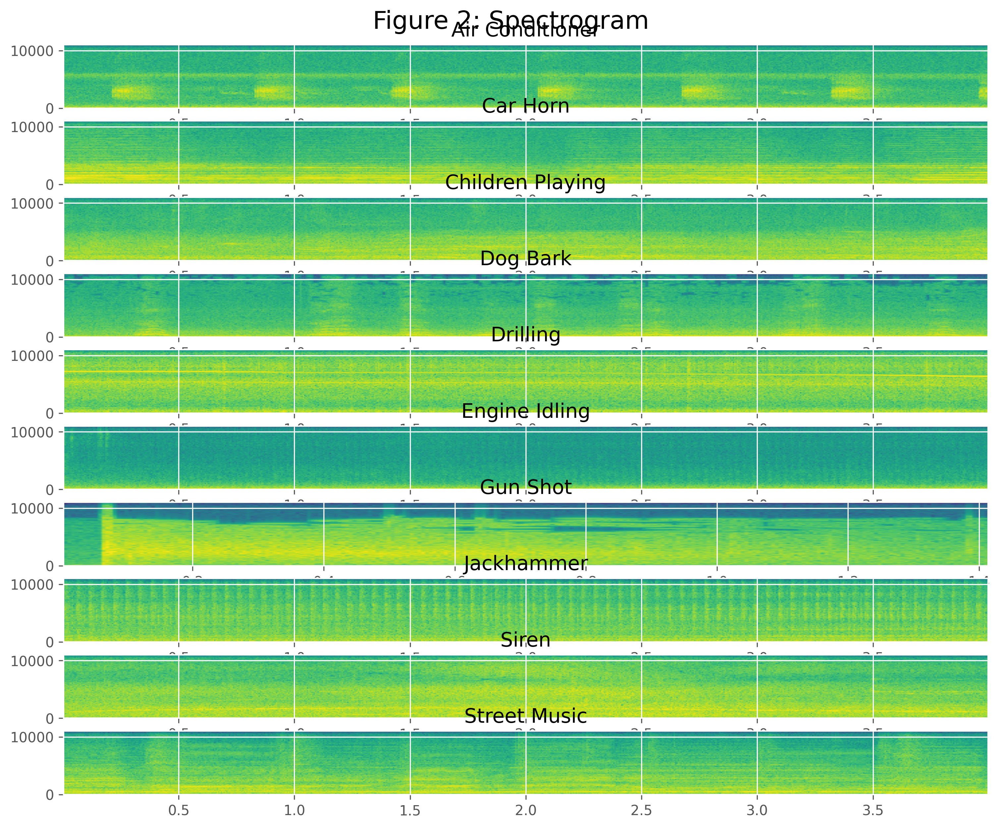

ValueError: ignored

<Figure size 3600x3300 with 0 Axes>

In [ ]:
plot_specgram(sound_names,raw_sounds)

#**Pre-Processing Data**

Since I am now extracting features, I have redirected my file directory to it's parent folder holding all 10 folds.

In [ ]:
os.chdir('/content/drive/MyDrive/Ummhowaboutnow')

In [ ]:
os.getcwd()

'/content/drive/MyDrive/Ummhowaboutnow'

In [ ]:
parent_dir = 'UrbanSound8K/audio/'
save_dir = "UrbanSound8K/processed/"
sub_dirs = np.array(['fold1','fold2','fold3','fold4',
                  'fold5','fold6','fold7','fold8',
                  'fold9','fold10'])


**NOTE**: As input, **parse_audio_files** retrieves parent directory name and the subdirectory lying within along with the file extension (.wav). This is iterated within all files in the sub-directory and invokes extract_feature. 
**extract_feature** perceives its input as the file path, uses Librosa.load to read, return and extract features:

**melspectrogram:** a mel-scaled power spectrogram


**mfcc:** Mel-frequency cepstral coefficients


**chorma-stft:** a chromagram from a waveform or power spectrogram


**spectral_contrast:** a spectral contrast


**tonnetz:** the tonal centroid features (tonnetz)

The two methods mentioned above earlier ensure that raw sound clips are morphed into features, with a class label for individual clips that are used for classification model learning. Each sound clip has it's class label in the file name, and therefore splitting strings by computing the array's second item gives the class label. For instance:

103258-5-0-10.wav is a file, then the class label is 5. 

Each file within a fold undergoes recursive iteration to extract corresponding labels and features, and the features are thus ultimately saved as numpy arrays.

Disclaimer: this feature extraction process takes about an hour/hour and a half.



In [ ]:
for sub_dir in sub_dirs:
    features, labels = parse_audio_files(parent_dir,sub_dir)
    np.savez("{0}{1}".format(save_dir, sub_dir), features=features,
             labels=labels)


UrbanSound8K/audio/fold1/176787-5-0-3.wav
UrbanSound8K/audio/fold1/176787-5-0-30.wav
UrbanSound8K/audio/fold1/176787-5-0-5.wav
UrbanSound8K/audio/fold1/176787-5-0-4.wav
UrbanSound8K/audio/fold1/176787-5-0-6.wav
UrbanSound8K/audio/fold1/176787-5-0-7.wav
UrbanSound8K/audio/fold1/177621-0-0-0.wav
UrbanSound8K/audio/fold1/176787-5-0-8.wav
UrbanSound8K/audio/fold1/176787-5-0-9.wav
UrbanSound8K/audio/fold1/177621-0-0-100.wav
UrbanSound8K/audio/fold1/177621-0-0-104.wav
UrbanSound8K/audio/fold1/177621-0-0-105.wav
UrbanSound8K/audio/fold1/177621-0-0-109.wav
UrbanSound8K/audio/fold1/177621-0-0-117.wav
UrbanSound8K/audio/fold1/177621-0-0-120.wav
UrbanSound8K/audio/fold1/177621-0-0-128.wav
UrbanSound8K/audio/fold1/177621-0-0-127.wav
UrbanSound8K/audio/fold1/177621-0-0-126.wav
UrbanSound8K/audio/fold1/177621-0-0-2.wav
UrbanSound8K/audio/fold1/177621-0-0-145.wav
UrbanSound8K/audio/fold1/177621-0-0-147.wav
UrbanSound8K/audio/fold1/177621-0-0-31.wav
UrbanSound8K/audio/fold1/177621-0-0-27.wav
UrbanSoun

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-0-0.wav
UrbanSound8K/audio/fold1/197318-6-10-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-11-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-12-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-2-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-3-0.wav
UrbanSound8K/audio/fold1/197318-6-5-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-4-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-6-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-7-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/197318-6-8-0.wav
UrbanSound8K/audio/fold1/197318-6-9-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/203356-3-0-0.wav
UrbanSound8K/audio/fold1/203356-3-0-1.wav
UrbanSound8K/audio/fold1/203356-3-0-2.wav
UrbanSound8K/audio/fold1/203440-3-0-0.wav
UrbanSound8K/audio/fold1/203356-3-0-3.wav
UrbanSound8K/audio/fold1/203440-3-0-5.wav
UrbanSound8K/audio/fold1/203440-3-0-1.wav
UrbanSound8K/audio/fold1/21684-9-0-12.wav
UrbanSound8K/audio/fold1/203440-3-0-6.wav
UrbanSound8K/audio/fold1/21684-9-0-25.wav
UrbanSound8K/audio/fold1/21684-9-0-30.wav
UrbanSound8K/audio/fold1/21684-9-0-39.wav
UrbanSound8K/audio/fold1/21684-9-0-5.wav
UrbanSound8K/audio/fold1/21684-9-0-50.wav
UrbanSound8K/audio/fold1/21684-9-0-7.wav
UrbanSound8K/audio/fold1/22962-4-0-0.wav
UrbanSound8K/audio/fold1/22962-4-0-2.wav
UrbanSound8K/audio/fold1/22962-4-0-1.wav
UrbanSound8K/audio/fold1/24074-1-0-0.wav
UrbanSound8K/audio/fold1/24074-1-0-1.wav
UrbanSound8K/audio/fold1/24074-1-0-11.wav
UrbanSound8K/audio/fold1/24074-1-0-10.wav
UrbanSound8K/audio/fold1/24074-1-0-12.wav
UrbanSound8K/audio/fold1/24074-1-0-13.wav

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/46669-4-0-37.wav
UrbanSound8K/audio/fold1/46669-4-0-4.wav
UrbanSound8K/audio/fold1/46669-4-0-45.wav
UrbanSound8K/audio/fold1/46669-4-0-48.wav
UrbanSound8K/audio/fold1/46669-4-0-49.wav
UrbanSound8K/audio/fold1/46669-4-0-54.wav
UrbanSound8K/audio/fold1/46669-4-0-63.wav
UrbanSound8K/audio/fold1/46669-4-0-61.wav
UrbanSound8K/audio/fold1/46669-4-0-9.wav
UrbanSound8K/audio/fold1/46669-4-0-8.wav
UrbanSound8K/audio/fold1/46918-5-0-1.wav
UrbanSound8K/audio/fold1/46918-5-0-0.wav
UrbanSound8K/audio/fold1/46918-5-0-2.wav
UrbanSound8K/audio/fold1/50901-0-1-0.wav
UrbanSound8K/audio/fold1/50901-0-0-0.wav
UrbanSound8K/audio/fold1/50901-0-1-1.wav
UrbanSound8K/audio/fold1/51022-3-13-0.wav
UrbanSound8K/audio/fold1/51022-3-30-4.wav
UrbanSound8K/audio/fold1/51022-3-7-0.wav
UrbanSound8K/audio/fold1/51022-3-29-0.wav
UrbanSound8K/audio/fold1/54858-3-0-0.wav
UrbanSound8K/audio/fold1/54858-3-1-2.wav
UrbanSound8K/audio/fold1/54858-3-2-0.wav
UrbanSound8K/audio/fold1/55020-4-0-0.wav
UrbanS

/usr/local/lib/python3.6/dist-packages/librosa/util/utils.py:1476: RuntimeWarning: invalid value encountered in less
  if np.any(X < 0) or np.any(X_ref < 0):
/usr/local/lib/python3.6/dist-packages/librosa/util/utils.py:1489: RuntimeWarning: invalid value encountered in less
  bad_idx = (Z < np.finfo(dtype).tiny)


UrbanSound8K/audio/fold1/87275-1-1-0.wav
UrbanSound8K/audio/fold1/87275-1-3-0.wav
UrbanSound8K/audio/fold1/87275-1-5-0.wav
UrbanSound8K/audio/fold1/87275-1-4-0.wav
UrbanSound8K/audio/fold1/88466-7-0-0.wav
UrbanSound8K/audio/fold1/89948-5-0-0.wav
UrbanSound8K/audio/fold1/89212-3-0-0.wav
UrbanSound8K/audio/fold1/9031-3-1-0.wav
UrbanSound8K/audio/fold1/9031-3-3-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')
/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/9031-3-2-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/9031-3-4-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/94868-1-0-0.wav
UrbanSound8K/audio/fold1/94868-1-1-0.wav
UrbanSound8K/audio/fold1/94868-1-2-0.wav
UrbanSound8K/audio/fold1/96158-4-0-0.wav
UrbanSound8K/audio/fold1/97317-2-0-22.wav
UrbanSound8K/audio/fold1/97317-2-0-23.wav
UrbanSound8K/audio/fold1/97317-2-0-25.wav
UrbanSound8K/audio/fold1/97317-2-0-28.wav
UrbanSound8K/audio/fold1/97317-2-0-34.wav
UrbanSound8K/audio/fold1/97317-2-0-36.wav
UrbanSound8K/audio/fold1/97317-2-0-5.wav
UrbanSound8K/audio/fold1/98223-7-0-0.wav
UrbanSound8K/audio/fold1/98223-7-1-0.wav
UrbanSound8K/audio/fold1/98223-7-10-0.wav
UrbanSound8K/audio/fold1/98223-7-2-0.wav
UrbanSound8K/audio/fold1/98223-7-3-0.wav
UrbanSound8K/audio/fold1/98223-7-4-0.wav
UrbanSound8K/audio/fold1/98223-7-5-0.wav
UrbanSound8K/audio/fold1/98223-7-7-0.wav
UrbanSound8K/audio/fold1/98223-7-6-0.wav
UrbanSound8K/audio/fold1/98223-7-8-0.wav
UrbanSound8K/audio/fold1/98223-7-9-0.wav
UrbanSound8K/audio/fold1/99180-9-0-0.wav
UrbanSound8K/audio/fold1/99180-9-0-36.wav
UrbanSou

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold1/17592-5-1-2.wav
UrbanSound8K/audio/fold1/17592-5-1-3.wav
UrbanSound8K/audio/fold1/176257-3-0-0.wav
UrbanSound8K/audio/fold1/176258-3-1-12.wav
UrbanSound8K/audio/fold1/176258-3-1-13.wav
UrbanSound8K/audio/fold1/176258-3-1-18.wav
UrbanSound8K/audio/fold1/176258-3-1-2.wav
UrbanSound8K/audio/fold1/176638-1-0-0.wav
UrbanSound8K/audio/fold1/176714-2-0-18.wav
UrbanSound8K/audio/fold1/176638-1-1-0.wav
UrbanSound8K/audio/fold1/176714-2-0-23.wav
UrbanSound8K/audio/fold1/176714-2-0-26.wav
UrbanSound8K/audio/fold1/176714-2-0-33.wav
UrbanSound8K/audio/fold1/176714-2-0-40.wav
UrbanSound8K/audio/fold1/176714-2-0-55.wav
UrbanSound8K/audio/fold1/176714-2-0-51.wav
UrbanSound8K/audio/fold1/176714-2-0-77.wav
UrbanSound8K/audio/fold1/176787-5-0-1.wav
UrbanSound8K/audio/fold1/176787-5-0-0.wav
UrbanSound8K/audio/fold1/176787-5-0-10.wav
UrbanSound8K/audio/fold1/176787-5-0-11.wav
UrbanSound8K/audio/fold1/176787-5-0-12.wav
UrbanSound8K/audio/fold1/176787-5-0-14.wav
UrbanSound8K/audio/fo

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/100652-3-0-3.wav
UrbanSound8K/audio/fold2/102104-3-0-0.wav
UrbanSound8K/audio/fold2/102871-8-0-14.wav
UrbanSound8K/audio/fold2/102871-8-0-13.wav
UrbanSound8K/audio/fold2/102858-5-0-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/102871-8-0-10.wav
UrbanSound8K/audio/fold2/102871-8-0-12.wav
UrbanSound8K/audio/fold2/102871-8-0-1.wav
UrbanSound8K/audio/fold2/100652-3-0-0.wav
UrbanSound8K/audio/fold2/100652-3-0-1.wav
UrbanSound8K/audio/fold2/104817-4-0-1.wav
UrbanSound8K/audio/fold2/104817-4-0-0.wav
UrbanSound8K/audio/fold2/102871-8-0-7.wav
UrbanSound8K/audio/fold2/102871-8-0-4.wav
UrbanSound8K/audio/fold2/102871-8-0-5.wav
UrbanSound8K/audio/fold2/102871-8-0-6.wav
UrbanSound8K/audio/fold2/102871-8-0-8.wav
UrbanSound8K/audio/fold2/104817-4-0-11.wav
UrbanSound8K/audio/fold2/102871-8-0-3.wav
UrbanSound8K/audio/fold2/102871-8-0-9.wav
UrbanSound8K/audio/fold2/102871-8-0-15.wav
UrbanSound8K/audio/fold2/104817-4-0-10.wav
UrbanSound8K/audio/fold2/102871-8-0-2.wav
UrbanSound8K/audio/fold2/106015-5-0-10.wav
UrbanSound8K/audio/fold2/104817-4-0-7.wav
UrbanSound8K/audio/fold2/106015-5-0-1.wav
UrbanSound8K/audio/fold2/106015-5-0-11.wav
UrbanSound8K/audio/fold2/104817-4-0-9.wav
UrbanSound8K/audio/fold2/10

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/35800-6-0-0.wav
UrbanSound8K/audio/fold2/40717-8-0-1.wav
UrbanSound8K/audio/fold2/34621-4-5-0.wav
UrbanSound8K/audio/fold2/39970-9-0-46.wav
UrbanSound8K/audio/fold2/34621-4-26-0.wav
UrbanSound8K/audio/fold2/34621-4-7-0.wav
UrbanSound8K/audio/fold2/34621-4-8-0.wav
UrbanSound8K/audio/fold2/39970-9-0-142.wav
UrbanSound8K/audio/fold2/34621-4-27-0.wav
UrbanSound8K/audio/fold2/37236-6-0-0.wav
UrbanSound8K/audio/fold2/39970-9-0-54.wav
UrbanSound8K/audio/fold2/39970-9-0-41.wav
UrbanSound8K/audio/fold2/39970-9-0-98.wav
UrbanSound8K/audio/fold2/34621-4-4-0.wav
UrbanSound8K/audio/fold2/40717-8-0-2.wav
UrbanSound8K/audio/fold2/40717-8-0-3.wav
UrbanSound8K/audio/fold2/4201-3-2-0.wav
UrbanSound8K/audio/fold2/4911-3-0-0.wav
UrbanSound8K/audio/fold2/50898-5-0-0.wav
UrbanSound8K/audio/fold2/4201-3-1-0.wav
UrbanSound8K/audio/fold2/40717-8-0-6.wav
UrbanSound8K/audio/fold2/46668-4-0-1.wav
UrbanSound8K/audio/fold2/46668-4-0-0.wav
UrbanSound8K/audio/fold2/50416-4-0-1.wav
UrbanSound8

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/76091-6-3-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/76086-4-0-36.wav
UrbanSound8K/audio/fold2/76090-6-0-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/77751-4-0-0.wav
UrbanSound8K/audio/fold2/76086-4-0-38.wav
UrbanSound8K/audio/fold2/77751-4-0-1.wav
UrbanSound8K/audio/fold2/76086-4-0-58.wav
UrbanSound8K/audio/fold2/76091-6-0-0.wav
UrbanSound8K/audio/fold2/76090-6-1-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/77751-4-1-0.wav
UrbanSound8K/audio/fold2/76086-4-0-55.wav
UrbanSound8K/audio/fold2/76086-4-0-32.wav
UrbanSound8K/audio/fold2/76086-4-0-27.wav
UrbanSound8K/audio/fold2/76091-6-2-0.wav
UrbanSound8K/audio/fold2/76086-4-0-3.wav
UrbanSound8K/audio/fold2/76086-4-0-53.wav
UrbanSound8K/audio/fold2/76091-6-4-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/76086-4-0-43.wav
UrbanSound8K/audio/fold2/76086-4-0-56.wav
UrbanSound8K/audio/fold2/76086-4-0-50.wav
UrbanSound8K/audio/fold2/76091-6-1-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/76089-6-0-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold2/76086-4-0-29.wav
UrbanSound8K/audio/fold2/77751-4-9-0.wav
UrbanSound8K/audio/fold2/77751-4-9-1.wav
UrbanSound8K/audio/fold2/77751-4-8-0.wav
UrbanSound8K/audio/fold2/77751-4-9-3.wav
UrbanSound8K/audio/fold2/77751-4-5-0.wav
UrbanSound8K/audio/fold2/77751-4-2-0.wav
UrbanSound8K/audio/fold2/77751-4-6-0.wav
UrbanSound8K/audio/fold2/77751-4-7-0.wav
UrbanSound8K/audio/fold2/77751-4-4-0.wav
UrbanSound8K/audio/fold2/79377-9-0-13.wav
UrbanSound8K/audio/fold2/79377-9-0-10.wav
UrbanSound8K/audio/fold2/77751-4-1-1.wav
UrbanSound8K/audio/fold2/77751-4-9-2.wav
UrbanSound8K/audio/fold2/79377-9-0-12.wav
UrbanSound8K/audio/fold2/77751-4-3-0.wav
UrbanSound8K/audio/fold2/91396-8-0-0.wav
UrbanSound8K/audio/fold2/84359-2-0-1.wav
UrbanSound8K/audio/fold2/79377-9-0-4.wav
UrbanSound8K/audio/fold2/91396-8-0-3.wav
UrbanSound8K/audio/fold2/79377-9-0-2.wav
UrbanSound8K/audio/fold2/84359-2-0-0.wav
UrbanSound8K/audio/fold2/84359-2-0-9.wav
UrbanSound8K/audio/fold2/84359-2-0-5.wav
UrbanSound8K

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold4/20688-2-0-0.wav
UrbanSound8K/audio/fold4/20688-2-0-4.wav
UrbanSound8K/audio/fold4/20688-2-0-1.wav
UrbanSound8K/audio/fold4/20688-2-0-2.wav
UrbanSound8K/audio/fold4/22883-7-23-0.wav
UrbanSound8K/audio/fold4/22883-7-17-4.wav
UrbanSound8K/audio/fold4/22883-7-11-0.wav
UrbanSound8K/audio/fold4/209864-5-0-3.wav
UrbanSound8K/audio/fold4/22883-7-18-0.wav
UrbanSound8K/audio/fold4/22883-7-100-0.wav
UrbanSound8K/audio/fold4/22883-7-10-0.wav
UrbanSound8K/audio/fold4/22883-7-17-5.wav
UrbanSound8K/audio/fold4/22883-7-17-2.wav
UrbanSound8K/audio/fold4/22883-7-27-0.wav
UrbanSound8K/audio/fold4/22883-7-28-0.wav
UrbanSound8K/audio/fold4/22883-7-19-0.wav
UrbanSound8K/audio/fold4/209864-5-0-2.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold4/22883-7-1-0.wav
UrbanSound8K/audio/fold4/22883-7-21-0.wav
UrbanSound8K/audio/fold4/22883-7-24-0.wav
UrbanSound8K/audio/fold4/22883-7-110-1.wav
UrbanSound8K/audio/fold4/209864-5-0-1.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold4/22883-7-49-3.wav
UrbanSound8K/audio/fold4/22883-7-43-2.wav
UrbanSound8K/audio/fold4/22883-7-48-0.wav
UrbanSound8K/audio/fold4/22883-7-3-0.wav
UrbanSound8K/audio/fold4/22883-7-34-0.wav
UrbanSound8K/audio/fold4/22883-7-39-1.wav
UrbanSound8K/audio/fold4/22883-7-36-1.wav
UrbanSound8K/audio/fold4/22883-7-37-0.wav
UrbanSound8K/audio/fold4/22883-7-40-0.wav
UrbanSound8K/audio/fold4/22883-7-44-0.wav
UrbanSound8K/audio/fold4/22883-7-39-0.wav
UrbanSound8K/audio/fold4/22883-7-36-2.wav
UrbanSound8K/audio/fold4/22883-7-47-2.wav
UrbanSound8K/audio/fold4/22883-7-29-2.wav
UrbanSound8K/audio/fold4/22883-7-33-0.wav
UrbanSound8K/audio/fold4/22883-7-35-3.wav
UrbanSound8K/audio/fold4/22883-7-49-1.wav
UrbanSound8K/audio/fold4/22883-7-36-0.wav
UrbanSound8K/audio/fold4/22883-7-35-2.wav
UrbanSound8K/audio/fold4/22883-7-91-0.wav
UrbanSound8K/audio/fold4/22883-7-62-0.wav
UrbanSound8K/audio/fold4/22883-7-92-0.wav
UrbanSound8K/audio/fold4/22883-7-61-1.wav
UrbanSound8K/audio/fold4/22883-7-77

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold5/159439-2-0-0.wav
UrbanSound8K/audio/fold5/159439-2-0-29.wav
UrbanSound8K/audio/fold5/157648-8-0-0.wav
UrbanSound8K/audio/fold5/159701-6-1-0.wav
UrbanSound8K/audio/fold5/159439-2-0-21.wav
UrbanSound8K/audio/fold5/159701-6-0-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold5/159439-2-0-10.wav
UrbanSound8K/audio/fold5/159439-2-0-19.wav
UrbanSound8K/audio/fold5/159439-2-0-30.wav
UrbanSound8K/audio/fold5/159701-6-3-0.wav
UrbanSound8K/audio/fold5/159701-6-4-0.wav
UrbanSound8K/audio/fold5/160010-2-0-33.wav
UrbanSound8K/audio/fold5/160010-2-0-32.wav
UrbanSound8K/audio/fold5/160010-2-0-21.wav
UrbanSound8K/audio/fold5/160010-2-0-30.wav
UrbanSound8K/audio/fold5/159701-6-5-0.wav
UrbanSound8K/audio/fold5/160010-2-0-19.wav
UrbanSound8K/audio/fold5/159701-6-6-0.wav
UrbanSound8K/audio/fold5/159754-8-0-0.wav
UrbanSound8K/audio/fold5/159703-6-0-0.wav
UrbanSound8K/audio/fold5/159754-8-2-0.wav
UrbanSound8K/audio/fold5/160010-2-0-37.wav
UrbanSound8K/audio/fold5/159754-8-4-0.wav
UrbanSound8K/audio/fold5/159754-8-3-0.wav
UrbanSound8K/audio/fold5/159754-8-1-0.wav
UrbanSound8K/audio/fold5/160010-2-0-38.wav
UrbanSound8K/audio/fold5/162318-2-0-34.wav
UrbanSound8K/audio/fold5/162318-2-0-25.wav
UrbanSound8K/audio/fold5/162318-2-0-17.wav
UrbanSound8K/audio/fo

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold5/77774-4-0-2.wav
UrbanSound8K/audio/fold5/77774-4-0-3.wav
UrbanSound8K/audio/fold5/80806-2-0-2.wav
UrbanSound8K/audio/fold5/77774-4-0-0.wav
UrbanSound8K/audio/fold5/77247-6-0-0.wav
UrbanSound8K/audio/fold5/77233-3-0-67.wav
UrbanSound8K/audio/fold5/77774-4-0-1.wav
UrbanSound8K/audio/fold5/77774-4-1-0.wav
UrbanSound8K/audio/fold5/77774-4-1-1.wav
UrbanSound8K/audio/fold5/76566-3-0-3.wav
UrbanSound8K/audio/fold5/77233-3-0-79.wav
UrbanSound8K/audio/fold5/77233-3-0-7.wav
UrbanSound8K/audio/fold5/80806-2-0-10.wav
UrbanSound8K/audio/fold5/77509-1-0-0.wav
UrbanSound8K/audio/fold5/80806-2-0-1.wav
UrbanSound8K/audio/fold5/85569-0-0-6.wav
UrbanSound8K/audio/fold5/85569-0-0-2.wav
UrbanSound8K/audio/fold5/85569-0-0-1.wav
UrbanSound8K/audio/fold5/83196-9-0-15.wav
UrbanSound8K/audio/fold5/83196-9-0-14.wav
UrbanSound8K/audio/fold5/85569-0-0-0.wav
UrbanSound8K/audio/fold5/84699-4-0-0.wav
UrbanSound8K/audio/fold5/85569-0-0-5.wav
UrbanSound8K/audio/fold5/80806-2-0-4.wav
UrbanSound8

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/157322-3-0-5.wav
UrbanSound8K/audio/fold6/159702-6-5-0.wav
UrbanSound8K/audio/fold6/159702-6-3-0.wav
UrbanSound8K/audio/fold6/159702-6-2-0.wav
UrbanSound8K/audio/fold6/160575-3-1-0.wav
UrbanSound8K/audio/fold6/161922-3-1-4.wav
UrbanSound8K/audio/fold6/161923-3-0-0.wav
UrbanSound8K/audio/fold6/161922-3-2-0.wav
UrbanSound8K/audio/fold6/159702-6-4-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/160575-3-7-0.wav
UrbanSound8K/audio/fold6/159702-6-6-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/161923-3-0-12.wav
UrbanSound8K/audio/fold6/160575-3-4-0.wav
UrbanSound8K/audio/fold6/161922-3-1-6.wav
UrbanSound8K/audio/fold6/161922-3-1-5.wav
UrbanSound8K/audio/fold6/159704-6-0-0.wav
UrbanSound8K/audio/fold6/160575-3-0-0.wav
UrbanSound8K/audio/fold6/166489-3-0-2.wav
UrbanSound8K/audio/fold6/164311-3-0-0.wav
UrbanSound8K/audio/fold6/162434-6-2-0.wav
UrbanSound8K/audio/fold6/165641-4-0-1.wav
UrbanSound8K/audio/fold6/162702-1-0-0.wav
UrbanSound8K/audio/fold6/162434-6-0-0.wav
UrbanSound8K/audio/fold6/162434-6-1-0.wav
UrbanSound8K/audio/fold6/166489-3-0-4.wav
UrbanSound8K/audio/fold6/165641-4-0-0.wav
UrbanSound8K/audio/fold6/164311-3-1-0.wav
UrbanSound8K/audio/fold6/161923-3-0-19.wav
UrbanSound8K/audio/fold6/161923-3-0-5.wav
UrbanSound8K/audio/fold6/162702-1-1-0.wav
UrbanSound8K/audio/fold6/166489-3-0-1.wav
UrbanSound8K/audio/fold6/166931-4-1-6.wav
UrbanSound8K/audio/fold6/166931-4-2-7.wav
UrbanSound8K/audio/fold6/166931-4-2-0.wav
UrbanSound8K/audio/fold6/166931-

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/39884-5-0-1.wav
UrbanSound8K/audio/fold6/39884-5-0-6.wav
UrbanSound8K/audio/fold6/42955-9-0-22.wav
UrbanSound8K/audio/fold6/44325-9-0-18.wav
UrbanSound8K/audio/fold6/39884-5-0-2.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/39884-5-0-3.wav
UrbanSound8K/audio/fold6/42955-9-0-18.wav
UrbanSound8K/audio/fold6/43802-1-2-0.wav
UrbanSound8K/audio/fold6/42955-9-0-14.wav
UrbanSound8K/audio/fold6/42955-9-0-12.wav
UrbanSound8K/audio/fold6/43802-1-0-0.wav
UrbanSound8K/audio/fold6/42955-9-0-19.wav
UrbanSound8K/audio/fold6/39884-5-0-4.wav
UrbanSound8K/audio/fold6/43802-1-1-0.wav
UrbanSound8K/audio/fold6/39884-5-0-0.wav
UrbanSound8K/audio/fold6/39884-5-0-7.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/46299-2-0-16.wav
UrbanSound8K/audio/fold6/46299-2-0-0.wav
UrbanSound8K/audio/fold6/46299-2-0-22.wav
UrbanSound8K/audio/fold6/44325-9-0-72.wav
UrbanSound8K/audio/fold6/44325-9-0-35.wav
UrbanSound8K/audio/fold6/46299-2-0-21.wav
UrbanSound8K/audio/fold6/44325-9-0-67.wav
UrbanSound8K/audio/fold6/46299-2-0-9.wav
UrbanSound8K/audio/fold6/47160-0-0-0.wav
UrbanSound8K/audio/fold6/47160-0-0-2.wav
UrbanSound8K/audio/fold6/46299-2-0-48.wav
UrbanSound8K/audio/fold6/47160-0-0-3.wav
UrbanSound8K/audio/fold6/47160-0-0-1.wav
UrbanSound8K/audio/fold6/44325-9-0-78.wav
UrbanSound8K/audio/fold6/46299-2-0-8.wav
UrbanSound8K/audio/fold6/46299-2-0-36.wav
UrbanSound8K/audio/fold6/51027-3-1-1.wav
UrbanSound8K/audio/fold6/52882-2-0-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/52882-2-0-6.wav
UrbanSound8K/audio/fold6/47160-0-0-4.wav
UrbanSound8K/audio/fold6/4912-3-0-0.wav
UrbanSound8K/audio/fold6/51027-3-0-9.wav
UrbanSound8K/audio/fold6/4910-3-0-0.wav
UrbanSound8K/audio/fold6/4912-3-2-0.wav
UrbanSound8K/audio/fold6/52882-2-0-4.wav
UrbanSound8K/audio/fold6/4912-3-1-0.wav
UrbanSound8K/audio/fold6/52882-2-0-3.wav
UrbanSound8K/audio/fold6/4912-3-3-0.wav
UrbanSound8K/audio/fold6/50455-5-0-0.wav
UrbanSound8K/audio/fold6/52882-2-0-11.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/51027-3-1-4.wav
UrbanSound8K/audio/fold6/51027-3-0-7.wav
UrbanSound8K/audio/fold6/52882-2-0-8.wav
UrbanSound8K/audio/fold6/58005-4-0-26.wav
UrbanSound8K/audio/fold6/58005-4-0-17.wav
UrbanSound8K/audio/fold6/58005-4-0-23.wav
UrbanSound8K/audio/fold6/54697-7-0-3.wav
UrbanSound8K/audio/fold6/52882-2-0-7.wav
UrbanSound8K/audio/fold6/57607-1-0-0.wav
UrbanSound8K/audio/fold6/54697-7-0-0.wav
UrbanSound8K/audio/fold6/54697-7-0-2.wav
UrbanSound8K/audio/fold6/54697-7-0-1.wav
UrbanSound8K/audio/fold6/58005-4-0-13.wav
UrbanSound8K/audio/fold6/54697-7-0-4.wav
UrbanSound8K/audio/fold6/58005-4-0-24.wav
UrbanSound8K/audio/fold6/58005-4-0-30.wav
UrbanSound8K/audio/fold6/58005-4-0-40.wav
UrbanSound8K/audio/fold6/58005-4-0-41.wav
UrbanSound8K/audio/fold6/62564-5-0-1.wav
UrbanSound8K/audio/fold6/58005-4-0-68.wav
UrbanSound8K/audio/fold6/58005-4-0-70.wav
UrbanSound8K/audio/fold6/58005-4-0-55.wav
UrbanSound8K/audio/fold6/58005-4-0-44.wav
UrbanSound8K/audio/fold6/58005-4-0-34.wav
Urb

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/94632-5-0-15.wav
UrbanSound8K/audio/fold6/9032-3-1-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/89442-9-0-6.wav
UrbanSound8K/audio/fold6/89442-9-0-34.wav
UrbanSound8K/audio/fold6/9032-3-2-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold6/89442-9-0-7.wav
UrbanSound8K/audio/fold6/94632-5-0-13.wav
UrbanSound8K/audio/fold6/94632-5-0-0.wav
UrbanSound8K/audio/fold6/89442-9-0-17.wav
UrbanSound8K/audio/fold6/85249-2-0-79.wav
UrbanSound8K/audio/fold6/94632-5-0-10.wav
UrbanSound8K/audio/fold6/89442-9-0-5.wav
UrbanSound8K/audio/fold6/89442-9-0-14.wav
UrbanSound8K/audio/fold6/94632-5-0-14.wav
UrbanSound8K/audio/fold6/94632-5-0-25.wav
UrbanSound8K/audio/fold6/94632-5-0-28.wav
UrbanSound8K/audio/fold6/94632-5-0-34.wav
UrbanSound8K/audio/fold6/94632-5-1-13.wav
UrbanSound8K/audio/fold6/94632-5-0-9.wav
UrbanSound8K/audio/fold6/94632-5-0-27.wav
UrbanSound8K/audio/fold6/94632-5-0-2.wav
UrbanSound8K/audio/fold6/94632-5-0-33.wav
UrbanSound8K/audio/fold6/94632-5-0-21.wav
UrbanSound8K/audio/fold6/94632-5-0-8.wav
UrbanSound8K/audio/fold6/94632-5-0-6.wav
UrbanSound8K/audio/fold6/94632-5-0-31.wav
UrbanSound8K/audio/fold6/94632-5-0-22.wav
UrbanSound8K/audio/fold6/94632-5-1-11.wav
UrbanSound8K/audio/fold6/94632-5-0-29.wav

/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold7/158593-2-0-0.wav
UrbanSound8K/audio/fold7/162728-1-0-0.wav
UrbanSound8K/audio/fold7/159708-6-2-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold7/164797-2-0-16.wav
UrbanSound8K/audio/fold7/159708-6-1-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold7/157950-3-0-0.wav
UrbanSound8K/audio/fold7/159708-6-4-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold7/164627-1-0-0.wav
UrbanSound8K/audio/fold7/158593-2-0-43.wav
UrbanSound8K/audio/fold7/159708-6-3-0.wav


/usr/local/lib/python3.6/dist-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')


UrbanSound8K/audio/fold7/158593-2-0-52.wav
UrbanSound8K/audio/fold7/158593-2-0-54.wav
UrbanSound8K/audio/fold7/158593-2-0-47.wav
UrbanSound8K/audio/fold7/157940-9-0-6.wav
UrbanSound8K/audio/fold7/159708-6-5-0.wav
UrbanSound8K/audio/fold7/158593-2-0-8.wav
UrbanSound8K/audio/fold7/165529-2-0-6.wav
UrbanSound8K/audio/fold7/165192-9-0-76.wav
UrbanSound8K/audio/fold7/165192-9-0-87.wav
UrbanSound8K/audio/fold7/165192-9-0-146.wav
UrbanSound8K/audio/fold7/164797-2-0-44.wav
UrbanSound8K/audio/fold7/164797-2-0-8.wav
UrbanSound8K/audio/fold7/164797-2-0-29.wav
UrbanSound8K/audio/fold7/165529-2-0-3.wav
UrbanSound8K/audio/fold7/165192-9-0-118.wav
UrbanSound8K/audio/fold7/165192-9-0-160.wav
UrbanSound8K/audio/fold7/164797-2-0-32.wav
UrbanSound8K/audio/fold7/164797-2-0-50.wav
UrbanSound8K/audio/fold7/164797-2-0-47.wav
UrbanSound8K/audio/fold7/165192-9-0-5.wav
UrbanSound8K/audio/fold7/165529-2-0-18.wav
UrbanSound8K/audio/fold7/168846-5-1-14.wav
UrbanSound8K/audio/fold7/168846-5-1-13.wav
UrbanSound8K/au

In [ ]:
glob.glob(os.path.join(parent_dir, 'fold1', '*.wav'))

#**Feedforward Neural Network**

In this project, I have implemented a FNN, CNN and a RNN to see which method yeilds the best accuracy in classifying sound clips to their respective category.
In this Feedforward Neural Network, there are three layers with 256, 128 and 64 neurons with an Adam Optimizer. 
Sparse Categorical Crossentropy is used to calculate the loss.


In [ ]:
def get_network():
    input_shape = (193,) #193 array to hold features - is the sum of the dimensions of features listed out in bullets above
    num_classes = 10
    keras.backend.clear_session()
    
    model = keras.models.Sequential()
    model.add(keras.layers.Dense(256, activation="relu", input_shape=input_shape))
    model.add(keras.layers.Dense(128, activation="relu", input_shape=input_shape))
    model.add(keras.layers.Dense(64, activation="relu", input_shape=input_shape))
    model.add(keras.layers.Dense(num_classes, activation = "softmax"))
    model.compile(optimizer=keras.optimizers.Adam(1e-5), 
        loss=keras.losses.SparseCategoricalCrossentropy(), 
        metrics=["accuracy"])
    
    return model

Here, 10-fold cross validation is used for training and evaluation. The training fold data is read, combined, and used to train the network. The Holdout method is then used to evaluate performance. This process is repeated for about ten times to cover fold numbers 1 through 10. Resulting accuracies are obtained and averaged to yield a final estimate.

In [ ]:
accuracies = []
folds = np.array(['fold1','fold2','fold3','fold4',
                  'fold5','fold6','fold7','fold8',
                  'fold9','fold10'])
load_dir = "UrbanSound8K/processed/"
kf = KFold(n_splits=10)
for train_index, test_index in kf.split(folds):
    x_train, y_train = [], []
    for ind in train_index:
        data = np.load("{0}/{1}.npz".format(load_dir,folds[ind]))
        x_train.append(data["features"])
        y_train.append(data["labels"])
    x_train = np.concatenate(x_train, axis = 0)
    y_train = np.concatenate(y_train, axis = 0)
    
    data = np.load("{0}/{1}.npz".format(load_dir,folds[test_index][0]))
    x_test = data["features"]
    y_test = data["labels"]
    
    model = get_network()
    model.fit(x_train, y_train, epochs = 150, batch_size = 24, verbose = 0)
    l, a = model.evaluate(x_test, y_test, verbose = 0)
    accuracies.append(a)
    print("Loss: {0} | Accuracy: {1}".format(l, a))
    
print("Average 10 Folds Accuracy: {0}".format(np.mean(accuracies)))

Loss: 4.245640277862549 | Accuracy: 0.4793578088283539
Loss: 2.5031955242156982 | Accuracy: 0.565315306186676
Loss: 2.5612587928771973 | Accuracy: 0.4648648500442505
Loss: 1.9813462495803833 | Accuracy: 0.5434343218803406
Loss: 1.8003290891647339 | Accuracy: 0.5908119678497314
Loss: 3.1189510822296143 | Accuracy: 0.5188335180282593
Loss: 1.663718581199646 | Accuracy: 0.6085919141769409
Loss: 3.0921363830566406 | Accuracy: 0.5248138904571533
Loss: 1.9334089756011963 | Accuracy: 0.6115196347236633
Loss: 1.8683505058288574 | Accuracy: 0.5388291478157043
Average 10 Folds Accuracy: 0.5446372359991074


**NOTE**: As seen here, the average 10-folds accuracy is 0.54463 with a FNN. We see better performance when introducing a CNN.

#Convolutional Neural Network

##Pre-processing and Extraction

To try and enhance accuracy results from the FNN, I've used a CNN.

From a sound clip, one can calculate log scaled mel-spectrograms and it's respective deltas. Using an input with fixed size, division/ segmentation of each sound clip into a size of 41 columns and 60 rows (60x41). 

The CNN is therefore being fed two channels; mel-spec and deltas. This is elaborated on and illustrated in the Project Report for better clarity.

In [ ]:
import glob
import os
import librosa
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

import tensorflow as tf
from tensorflow import keras

def extract_features(parent_dir,sub_dirs,file_ext="*.wav",
                     bands=60,frames=41):
    def _windows(data, window_size):
        start = 0
        while start < len(data):
            yield int(start), int(start + window_size)
            start += (window_size // 2)

    window_size = 512 * (frames - 1)
    features, labels = [], []
    for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
        segment_log_specgrams, segment_labels = [], []
        sound_clip,sr = librosa.load(fn)
        label = int(fn.split('/')[3].split('-')[1])
        for (start,end) in _windows(sound_clip,window_size):
            if(len(sound_clip[start:end]) == window_size):
                signal = sound_clip[start:end]
                melspec = librosa.feature.melspectrogram(signal,n_mels=bands)
                logspec = librosa.amplitude_to_db(melspec)
                logspec = logspec.T.flatten()[:, np.newaxis].T
                segment_log_specgrams.append(logspec)
                segment_labels.append(label)

        segment_log_specgrams = np.asarray(segment_log_specgrams).reshape(
            len(segment_log_specgrams),bands,frames,1)
        segment_features = np.concatenate((segment_log_specgrams, np.zeros(
            np.shape(segment_log_specgrams))), axis=3)
        for i in range(len(segment_features)):
            segment_features[i, :, :, 1] = librosa.feature.delta(
                segment_features[i, :, :, 0])

        if len(segment_features) > 0: # check for empty segments
            features.append(segment_features)
            labels.append(segment_labels)
    return features, labels

**NOTE**: To prepare data for this CNN, I have used **extract_feature** (iterates over files within folds and appends features and class labels to arrays) and **windows**. 

In [ ]:
# Pre-processing and Extraction:
parent_dir = 'UrbanSound8K/audio/'
save_dir = "UrbanSound8K/processed/"
folds = sub_dirs = np.array(['fold1','fold2','fold3','fold4',
                  'fold5','fold6','fold7','fold8',
                  'fold9','fold10'])
for sub_dir in sub_dirs:
    features, labels = extract_features(parent_dir,sub_dir)
    np.savez("{0}{1}".format(save_dir, sub_dir),
             features=features,
             labels=labels)

##CNN Architecture

**NOTE:** This CNN has 4 layers, proceeding with Batch Normalization and Max Pooling. Global Pooling is added after the final convolutional layer for embedding extraction, which is in turn followed by a fully-connected layer. Finally, softmax activation in a dense layer is introduced to output probabilities of audio classes. For training the network, Adam Optimizer is enforced to lower Sparse Categorical Crossentropy objectives.

In [ ]:
def get_network():
    num_filters = [24,32,64,128] 
    pool_size = (2, 2) 
    kernel_size = (3, 3)  
    input_shape = (60, 41, 2)
    num_classes = 10
    keras.backend.clear_session()
    
    model = keras.models.Sequential()
    model.add(keras.layers.Conv2D(24, kernel_size,
                padding="same", input_shape=input_shape))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))

    model.add(keras.layers.Conv2D(32, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))  
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))
    
    model.add(keras.layers.Conv2D(64, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))  
    model.add(keras.layers.MaxPooling2D(pool_size=pool_size))
    
    model.add(keras.layers.Conv2D(128, kernel_size,
                                  padding="same"))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.Activation("relu"))  

    model.add(keras.layers.GlobalMaxPooling2D())
    model.add(keras.layers.Dense(128, activation="relu"))
    model.add(keras.layers.Dense(num_classes, activation="softmax"))

    model.compile(optimizer=keras.optimizers.Adam(1e-4), 
        loss=keras.losses.SparseCategoricalCrossentropy(), 
        metrics=["accuracy"])
    return model

##Training and Evaluating the Model with 10-fold Cross Validation

Test sound clips undergo evaluation by averaging predictions encapsulating entire segments of audio, under the assumption that the clips are of unknown length. Finally, 10-fold accuracies are averaged to quantify network performance estimation.

In [ ]:
accuracies = []
folds = np.array(['fold1','fold2','fold3','fold4',
                  'fold5','fold6','fold7','fold8',
                  'fold9','fold10'])
load_dir = "UrbanSound8K/processed/"
kf = KFold(n_splits=10)
for train_index, test_index in kf.split(folds):
    x_train, y_train = [], []
    for ind in train_index:
        # Reading segments from an audio file:
        train_data = np.load("{0}/{1}.npz".format(load_dir,folds[ind]), 
                       allow_pickle=True)
        # Amalagamating segments to be stacked for training, so that they are rendered as an instance:
        features = np.concatenate(train_data["features"], axis=0) 
        labels = np.concatenate(train_data["labels"], axis=0)
        x_train.append(features)
        y_train.append(labels)
    # (x,y) pairs of all training folds are stacked:
    x_train = np.concatenate(x_train, axis = 0).astype(np.float32)
    y_train = np.concatenate(y_train, axis = 0).astype(np.float32)
    
    # Predictions on every segment are made for testing and are averaged to produce individual labels for audio clips.
    test_data = np.load("{0}/{1}.npz".format(load_dir,
                   folds[test_index][0]), allow_pickle=True)
    x_test = test_data["features"]
    y_test = test_data["labels"]

    model = get_network()
    model.fit(x_train, y_train, epochs = 50, batch_size = 24, verbose = 0)
    
        # Using test folds for evaluation:
    y_true, y_pred = [], []
    for x, y in zip(x_test, y_test):
        # Using segments of sound clips to evaluate averaging predictions over:
        avg_p = np.argmax(np.mean(model.predict(x), axis = 0))
        y_pred.append(avg_p) 
        # Using singular labels of sound clips with np.unique:
        y_true.append(np.unique(y)[0]) 
    accuracies.append(accuracy_score(y_true, y_pred))    
print("Average 10 Folds Accuracy: {0}".format(np.mean(accuracies)))

Average 10 Folds Accuracy: 0.614724419452301


**NOTE**: Much better than our FNN result, and better than the RNN too (as you will see later), we get an accuracy of 0.6417 which is considered good, given the structure of our dataset and the intricacies behind the selection of features used for this type of classification.

#Recurrent Neural Network

I've now used a RNN to try to achieve better accuracy results than with CNN and FNN. This RNN uses GRU - A Gated Recurrent Unit (chosen this primarily since it trains the model faster)

In [ ]:
import glob
import os
import librosa
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

import tensorflow as tf
from tensorflow import keras

In [ ]:
def extract_features(parent_dir, sub_dirs, file_ext="*.wav", 
                     bands=20, frames=41):
    def _windows(data, window_size):
        start = 0
        while start < len(data):
            yield start, start + window_size
            start += (window_size // 2)    

    window_size = 512 * (frames - 1)
    features, labels = [], []
    for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
        segment_mfcc, segment_labels = [], []
        sound_clip, sr = librosa.load(fn)
        label = int(fn.split('/')[3].split('-')[1])
        for (start,end) in _windows(sound_clip,window_size):
            if(len(sound_clip[start:end]) == window_size):
                signal = sound_clip[start:end]
                mfcc = librosa.feature.mfcc(y=signal, sr=sr, 
                        n_mfcc=bands).T.flatten()[:, np.newaxis].T
                segment_mfcc.append(mfcc)
                segment_labels.append(label)
                
        segment_mfcc = np.asarray(segment_mfcc).reshape(
            len(segment_mfcc),frames,bands)
        
        if len(segment_mfcc) > 0: # check for empty segments 
            features.append(segment_mfcc)
            labels.append(segment_labels) 
            
    return features, labels

In [ ]:
parent_dir = 'UrbanSound8K/audio/'
save_dir = "UrbanSound8K/processed/"
folds = sub_dirs = np.array(['fold1','fold2','fold3','fold4',
                  'fold5','fold6','fold7','fold8',
                  'fold9','fold10'])
for sub_dir in sub_dirs:
    features, labels = extract_features(parent_dir,sub_dir)
    np.savez("{0}{1}".format(save_dir, sub_dir), features=features, labels=labels)

##Illustrating GRU (Gated Recurrent Unit) based Recurrent Network Architecture

In [ ]:
def get_network():
    input_shape = (41, 20)
    num_classes = 10
    keras.backend.clear_session()
    
    model = keras.models.Sequential()
    model.add(keras.layers.GRU(128, input_shape=input_shape))
    model.add(keras.layers.Dense(128, activation="relu"))
    model.add(keras.layers.Dense(num_classes, activation = "softmax"))
    model.compile(optimizer=keras.optimizers.Adam(1e-4), 
        loss=keras.losses.SparseCategoricalCrossentropy(), 
        metrics=["accuracy"])
    
    return model

##Evaluation and Training with 10-folds Cross Validation

In [ ]:
accuracies = []
folds = np.array(['fold1','fold2','fold3','fold4',
                  'fold5','fold6','fold7','fold8',
                  'fold9','fold10'])
load_dir = "UrbanSound8K/processed/"
kf = KFold(n_splits=10)
for train_index, test_index in kf.split(folds):
    x_train, y_train = [], []
    for ind in train_index:
        # Reading segments from an audio file:
        train_data = np.load("{0}/{1}.npz".format(load_dir,folds[ind]), 
                       allow_pickle=True)
        # Amalagamating segments to be stacked for training, so that they are rendered as an instance:
        features = np.concatenate(train_data["features"], axis=0) 
        labels = np.concatenate(train_data["labels"], axis=0)
        x_train.append(features)
        y_train.append(labels)
    # (x,y) pairs of all training folds are stacked:
    x_train = np.concatenate(x_train, axis = 0).astype(np.float32)
    y_train = np.concatenate(y_train, axis = 0).astype(np.float32)
    
    # Predictions on every segment are made for testing and are averaged to produce individual labels for audio clips. 
    test_data = np.load("{0}/{1}.npz".format(load_dir,
                   folds[test_index][0]), allow_pickle=True)
    x_test = test_data["features"]
    y_test = test_data["labels"]

    model = get_network()
    model.fit(x_train, y_train, epochs = 3, batch_size = 24, verbose = 0)
    
    # Using test folds for evaluation:
    y_true, y_pred = [], []
    for x, y in zip(x_test, y_test):
        # # Using segments of sound clips to evaluate averaging predictions over:
        avg_p = np.argmax(np.mean(model.predict(x), axis = 0))
        y_pred.append(avg_p) 
        # Using singular labels of sound clips with np.unique:
        y_true.append(np.unique(y)[0]) 
    accuracies.append(accuracy_score(y_true, y_pred))   
print("Average 10 Folds Accuracy: {0}".format(np.mean(accuracies)))

Average 10 Folds Accuracy: 0.5419997827430258


**NOTE:** Here, we can see that the average test accuracy is 0.5419, the model performing a little less efficiently than the CNN itself. 